In [24]:
import mysql.connector
import pandas as pd
from mysql.connector import connect, errorcode
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-white')
#import warnings
#warnings.filterwarnings("ignore")
import seaborn as sns
import plotly.express as px
from sorted_months_weekdays import *
from sort_dataframeby_monthorweek import *
import json
import requests

In [2]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In [3]:
try:  
    conn = mysql.connector.connect(
        user = 'root',
        password = 'XXXXXXXXX',
        host = 'localhost',
        database = 'Data' )
    print('It works')
except mysql.connector.Error as e:
    if e.errno == errorcod.ER_ACESS_DENIED_ERROR:
        print('Something is wrong with username or Password')
    elif e.errno ==  errorcode.ER_BAD_DB_ERROR:
        print('Database Does not exist')
    else:
        print(e)

It works


In [4]:
conn

In [5]:
cursor = conn.cursor() 
#cursor.fetchall()

In [6]:
cursor.execute("show databases")
databases = cursor.fetchall()

In [7]:
databases

[('Data',),
 ('information_schema',),
 ('mysql',),
 ('performance_schema',),
 ('sys',)]

In [8]:
df = pd.read_sql("SELECT * FROM loi", conn)
df.shape

<ipython-input-8-1feb363f8a62>:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql("SELECT * FROM loi", conn)


(213, 13)

In [9]:
df_check = df.isnull()
for column in df_check.columns.values.tolist():
    print(column)
    print (df_check[column].value_counts())
    print("")  

ID
False    213
Name: ID, dtype: int64

Occurred_Date
False    213
Name: Occurred_Date, dtype: int64

Occurred_Month
False    213
Name: Occurred_Month, dtype: int64

Occurred_Year
False    213
Name: Occurred_Year, dtype: int64

Time_of_Day
False    213
Name: Time_of_Day, dtype: int64

Weekday
False    213
Name: Weekday, dtype: int64

Neighbourhood
False    213
Name: Neighbourhood, dtype: int64

Division
False    213
Name: Division, dtype: int64

Ward
False    213
Name: Ward, dtype: int64

Councillor
False    213
Name: Councillor, dtype: int64

Level_of_Injury
False    213
Name: Level_of_Injury, dtype: int64

x
False    213
Name: x, dtype: int64

y
False    213
Name: y, dtype: int64



In [10]:
len(df['Neighbourhood'].unique())

66

In [11]:
df

,ID,Occurred_Date,Occurred_Month,Occurred_Year,Time_of_Day,Weekday,Neighbourhood,Division,Ward,Councillor,Level_of_Injury,x,y
0,5825,2022-07-05,July,2022,Afternoon,Tuesday,Ledbury - Heron Gate - Ridgemont - Elmwood,East,Ward 16 - River,Riley Brockington,FATAL,-75.657152,45.365240
1,8759,2022-04-04,April,2022,Afternoon,Monday,Ledbury - Heron Gate - Ridgemont - Elmwood,East,Ward 18 - Alta Vista,Marty Carr,MINOR,-75.656783,45.378759
2,9156,2018-05-21,May,2018,Evening,Monday,Ledbury - Heron Gate - Ridgemont - Elmwood,East,Ward 10 - Gloucester-Southgate,Jessica Bradley,MINOR,-75.653527,45.372529
3,7144,2018-01-16,January,2018,Afternoon,Tuesday,Ledbury - Heron Gate - Ridgemont - Elmwood,East,Ward 16 - River,Riley Brockington,MINOR,-75.654366,45.374002
4,58912,2019-05-27,May,2019,Evening,Monday,Ledbury - Heron Gate - Ridgemont - Elmwood,East,Ward 10 - Gloucester-Southgate,Jessica Bradley,FATAL,-75.648405,45.373049
...,...,...,...,...,...,...,...,...,...,...,...,...,...
208,5673,2018-01-21,January,2018,Night,Sunday,Bells Corners West,West,Ward 8 - College,Laine Johnson,NONE,-75.830293,45.311989
209,2712,2018-01-09,January,2018,Evening,Tuesday,Hunt Club East - Western Community,East,Ward 16 - River,Riley Brockington,FATAL,-75.674849,45.349145
210,11070,2022-04-25,April,2022,Evening,Monday,Greenbelt - Mer Bleue,East,Ward 10 - Gloucester-Southgate,Jessica Bradley,MAJOR,-75.560872,45.408547
211,4966,2021-05-15,May,2021,Evening,Saturday,Greenbelt SouthEast,East,Ward 10 - Gloucester-Southgate,Jessica Bradley,MINOR,-75.545233,45.370011


In [12]:
#filter
df_peryear = df[df['Occurred_Year'] == 2018]

In [13]:
df['Neighbourhood'].value_counts().head(12)

Ledbury - Heron Gate - Ridgemont - Elmwood    15
Byward Market                                 12
Overbrook - McArthur                          10
Hunt Club Park                                 9
Centretown                                     9
Whitehaven - Queensway Terrace North           8
Lowertown                                      8
Greenboro East                                 7
Vanier North                                   6
Britannia Village                              6
Emerald Woods - Sawmill Creek                  6
Hawthorne Meadows - Sheffield Glen             6
Name: Neighbourhood, dtype: int64

In [14]:
incidents = df[['Level_of_Injury']].value_counts()
incidents = incidents.to_frame('Count').reset_index()
incidents

,Level_of_Injury,Count
0,MAJOR,73
1,NONE,69
2,MINOR,44
3,FATAL,23
4,UNKNOWN,4


In [15]:
for index, value in enumerate(incidents['Count']):
    print(index)
    print(value)

0
73
1
69
2
44
3
23
4
4


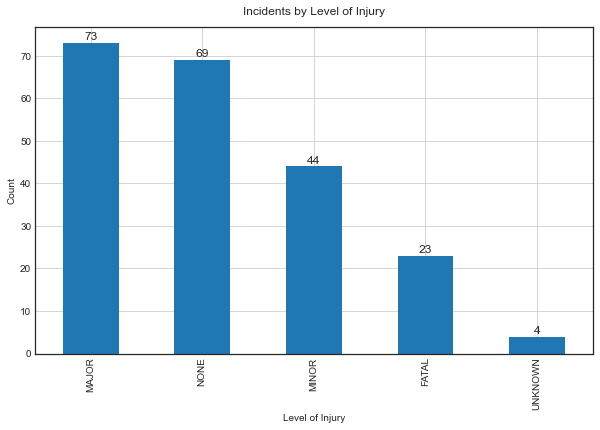

In [25]:
incidents.plot(kind ='bar', x = 'Level_of_Injury', figsize=(10, 6), legend = False)

plt.xlabel('Level of Injury')
plt.ylabel('Count')
plt.title('Incidents by Level of Injury', y= 1.02)
plt.grid(True)
#plt.annotate(incidents['Count', xy=(2,10), ha='center')

for index, value in enumerate(incidents['Count']):
    plt.annotate(value, xy=(index, value), xytext=(0, 3),textcoords='offset points', fontsize=12, ha='center')


plt.show()

In [17]:
fig = px.bar(incidents, x = 'Level_of_Injury', y= 'Count', text = 'Count',
        labels={"index": "Level of Injury", "y" : "Shooting Events"}
)

fig.update_traces(textposition='outside')

fig.show()

In [18]:
incidents_peryear = df_peryear[['Level_of_Injury']].value_counts()
incidents_peryear = incidents_peryear.to_frame('Count').reset_index()
incidents_peryear


,Level_of_Injury,Count
0,NONE,16
1,MAJOR,14
2,MINOR,11
3,FATAL,6


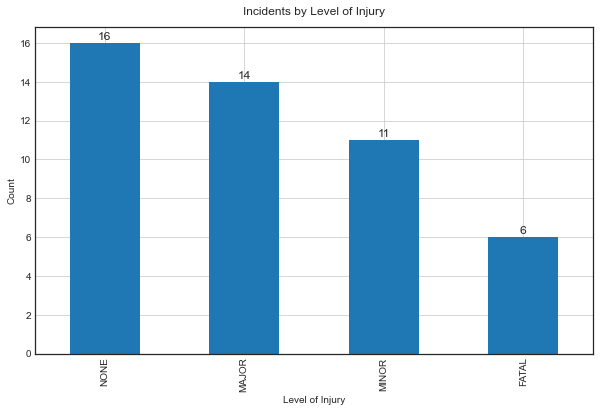

In [26]:
incidents_peryear.plot(kind ='bar', x = 'Level_of_Injury', figsize=(10, 6), legend = False)

plt.xlabel('Level of Injury')
plt.ylabel('Count')
plt.title('Incidents by Level of Injury', y= 1.02)
plt.grid(True)
#plt.annotate(incidents['Count', xy=(2,10), ha='center')

for index, value in enumerate(incidents_peryear['Count']):
    plt.annotate(value, xy=(index, value), xytext=(0, 3),textcoords='offset points', fontsize=12, ha='center')


plt.show()

In [20]:
fig = px.bar(incidents_peryear, x = 'Level_of_Injury', y= 'Count', text = 'Count',
        labels={"index": "Level of Injury", "y" : "Shooting Events"}
)

fig.update_traces(textposition='outside')

fig.show()

In [21]:
df_ToD = df['Time_of_Day'].value_counts()
df_ToD = df_ToD.to_frame('Number of Incidents')
df_ToD


,Number of Incidents
Evening,95
Night,66
Afternoon,40
Morning,12


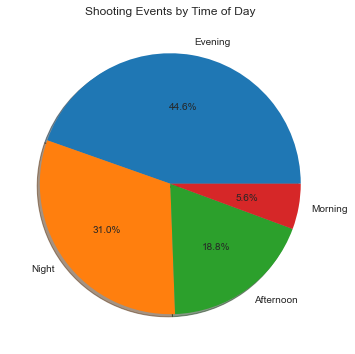

In [27]:
df_ToD.plot(kind ='pie', y = 'Number of Incidents', ylabel='',figsize=(10, 6), autopct='%1.1f%%', shadow = True,legend = False)
plt.title('Shooting Events by Time of Day')
#plt.ylabel('')
plt.show()

In [23]:
fig = px.pie(df_ToD, values ='Number of Incidents', names =df_ToD.index, hole=.25,
                             #text = df_ToD['Number of Incidents'],
                             labels={"index" : 'Time of Day'},
                             title= 'Shooting Events by Time of Day'
)
fig.update_traces(textposition='outside',textinfo='label+percent')
fig.update_layout(showlegend=False , title_x= 0.46)
fig

In [28]:
df_ToD_peryear = df_peryear['Time_of_Day'].value_counts()
df_ToD_peryear = df_ToD_peryear.to_frame('Number of Incidents')
df_ToD_peryear

,Number of Incidents
Evening,22
Night,16
Afternoon,8
Morning,1


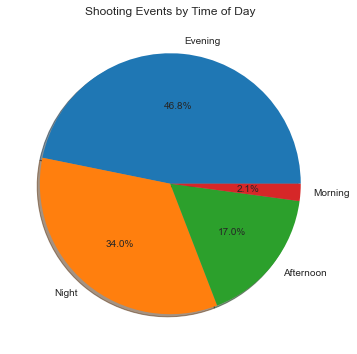

In [29]:
df_ToD_peryear.plot(kind ='pie', y = 'Number of Incidents', ylabel='',figsize=(10, 6), autopct='%1.1f%%', shadow = True,legend = False)
plt.title('Shooting Events by Time of Day')
#plt.ylabel('')
plt.show()

In [26]:
fig = px.pie(df_ToD_peryear, values ='Number of Incidents', names =df_ToD_peryear.index, hole=.25,
                             #text = df_ToD['Number of Incidents'],
                             labels={"index" : 'Time of Day'},
                             title= 'Shooting Events by Time of Day per year'
)
fig.update_traces(textposition='outside',textinfo='label+percent')
fig.update_layout(showlegend=False , title_x= 0.46)
fig

In [30]:
df_division = df[['Division', 'Level_of_Injury']].groupby('Division').count()
df_division = df_division['Level_of_Injury'].sort_values(ascending =False) # to series
df_division = df_division.to_frame().reset_index()
df_division

,Division,Level_of_Injury
0,East,91
1,Central,68
2,West,54


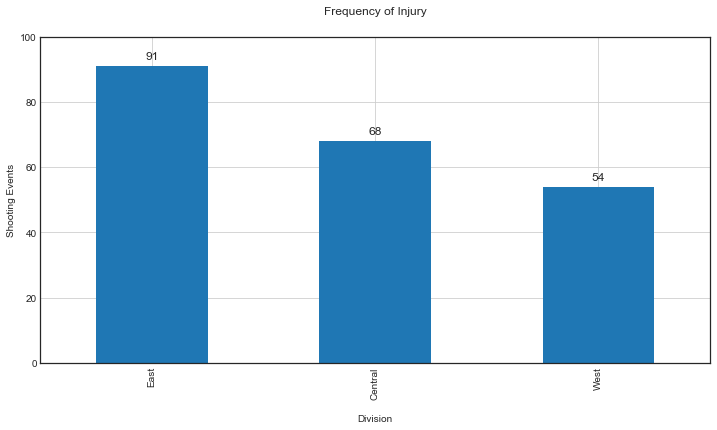

In [31]:
df_division.plot(kind ='bar', x= 'Division', y ='Level_of_Injury',  figsize=(12, 6), legend = False)

plt.title('Frequency of Injury', y= 1.05)
plt.grid(True)
plt.ylim(0,100)
plt.xlabel('Division',  labelpad=15)
plt.ylabel('Shooting Events')

for index, value in enumerate(df_division['Level_of_Injury']):
    plt.annotate(value, xy=( index, value+2 ), ha='center', fontsize = 12)


plt.show()

In [32]:
fig = px.bar(df_division, x ='Division', y = 'Level_of_Injury', 
                             text = 'Level_of_Injury',
                             labels={"Level_of_Injury" : 'Shooting Events'},
                             title= 'Number of Shooting Events by Divison - Overall'
)

fig.update_layout(title_x= 0.5)
fig

In [33]:
df_division_peryear = df_peryear[['Division', 'Level_of_Injury']].groupby('Division').count()
df_division_peryear = df_division_peryear['Level_of_Injury'].sort_values(ascending =False) # to series
df_division_peryear = df_division_peryear.to_frame().reset_index()
df_division_peryear

,Division,Level_of_Injury
0,East,26
1,Central,11
2,West,10


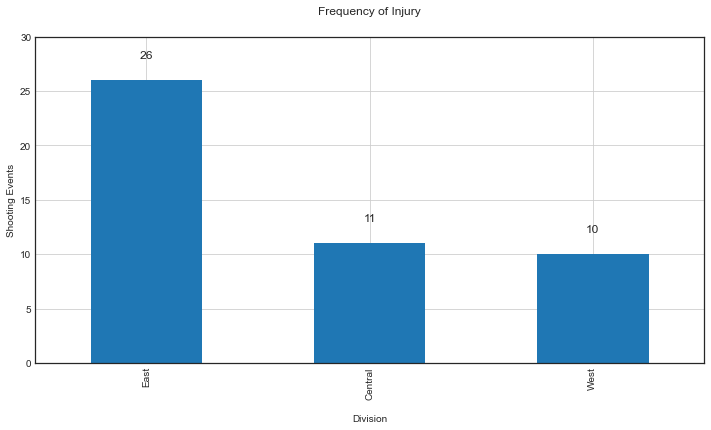

In [34]:
df_division_peryear.plot(kind ='bar', x= 'Division', y ='Level_of_Injury',  figsize=(12, 6), legend = False)

plt.title('Frequency of Injury', y= 1.05)
plt.grid(True)
plt.ylim(0,30)
plt.xlabel('Division',  labelpad=15)
plt.ylabel('Shooting Events')

for index, value in enumerate(df_division_peryear['Level_of_Injury']):
    plt.annotate(value, xy=( index, value+2 ), ha='center', fontsize = 12)


plt.show()

In [32]:
fig = px.bar(df_division_peryear, x ='Division', y = 'Level_of_Injury', 
                             text = 'Level_of_Injury',
                             labels={"Level_of_Injury" : 'Shooting Events'},
                             title= 'Number of Shooting Events by Divison - Overall'
)

fig.update_layout(title_x= 0.5)
fig

In [35]:
df_years = df[['Occurred_Year', 'Level_of_Injury', 'ID']].groupby(['Occurred_Year','Level_of_Injury']).count()
df_years= df_years.reset_index()
df_years.head()

,Occurred_Year,Level_of_Injury,ID
0,2018,FATAL,6
1,2018,MAJOR,14
2,2018,MINOR,11
3,2018,NONE,16
4,2019,FATAL,4


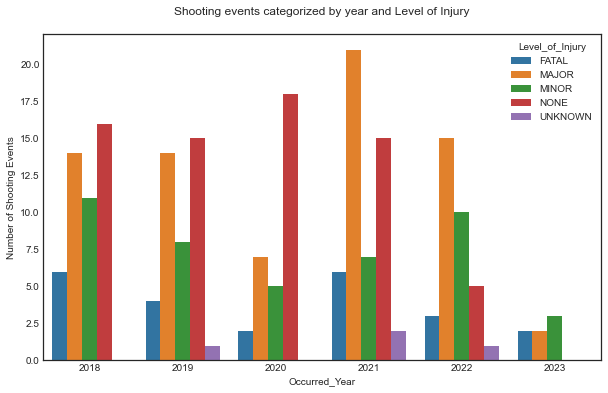

In [36]:
plt.figure(figsize=(10, 6))
sns.barplot(df_years, x = 'Occurred_Year', y = 'ID', hue= 'Level_of_Injury')
plt.ylabel('Number of Shooting Events')
plt.title('Shooting events categorized by year and Level of Injury', y= 1.04)
plt.grid(False)
plt.show()

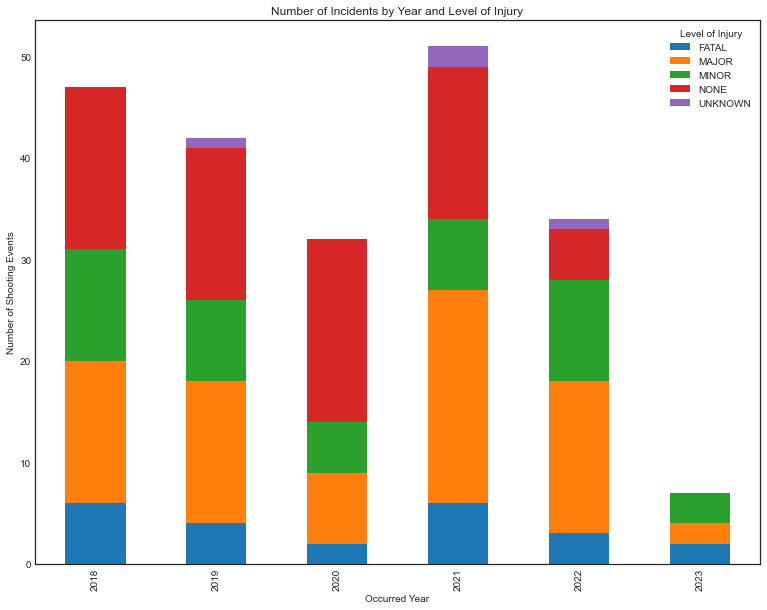

In [37]:
pivot_df = df_years.pivot(index='Occurred_Year', columns='Level_of_Injury', values='ID')

# Plotting
pivot_df.plot(kind='bar',stacked=True, figsize=(13,10))
plt.title('Number of Incidents by Year and Level of Injury')
plt.xlabel('Occurred Year')
plt.ylabel('Number of Shooting Events')
plt.legend(title='Level of Injury')
plt.show()
#Shooting events categorized by year - rows without an entry in the Level of Injury column
#have been omitted. 

In [38]:
pivot_df

Level_of_Injury,FATAL,MAJOR,MINOR,NONE,UNKNOWN
Occurred_Year,,,,,
2018,6.0,14.0,11.0,16.0,NaN
2019,4.0,14.0,8.0,15.0,1.0
2020,2.0,7.0,5.0,18.0,NaN
2021,6.0,21.0,7.0,15.0,2.0
2022,3.0,15.0,10.0,5.0,1.0
2023,2.0,2.0,3.0,NaN,NaN


In [37]:
figure = px.bar(pivot_df, x =pivot_df.index, y = pivot_df.columns, #labels={"variable": "Level of Injury",
                                               # "Occurred_Month" : 'Occurred Month',
                                               # "value" : "Number of Incidents"},
                                        title= "Number of Incidents by Month and Level of Injury Overall"
               )
figure.update_layout(title={
                         'text': 'Number of Incidents by Month and Level of Injury Overall',
                         'x': 0.5,  # Center the title horizontally
                         'xanchor': 'center'  # Anchor the title to the center
})
figure

In [39]:
df_month = df[['Occurred_Month', 'Level_of_Injury', 'ID']].groupby(['Occurred_Month','Level_of_Injury']).count() 
df_month = df_month.reset_index()
df_month

,Occurred_Month,Level_of_Injury,ID
0,April,FATAL,1
1,April,MAJOR,4
2,April,MINOR,3
3,April,NONE,5
4,August,FATAL,2
5,August,MAJOR,7
6,August,MINOR,6
7,August,NONE,3
8,December,FATAL,1
9,December,MAJOR,5


In [40]:
df_month_sorted = Sort_Dataframeby_Month(df=df_month,monthcolumnname='Occurred_Month')
df_month_sorted

,Occurred_Month,Level_of_Injury,ID
0,January,FATAL,3
1,January,MAJOR,11
2,January,MINOR,6
3,January,NONE,7
4,February,FATAL,4
5,February,MAJOR,6
6,February,MINOR,3
7,February,NONE,6
8,March,FATAL,1
9,March,MAJOR,5


In [41]:
pivot_month_df = df_month_sorted.pivot(index='Occurred_Month', columns='Level_of_Injury', values='ID')
pivot_month_df = pivot_month_df.reset_index()
pivot_month_df = Sort_Dataframeby_Month(df=pivot_month_df,monthcolumnname='Occurred_Month')
pivot_month_df = pivot_month_df.set_index('Occurred_Month')
pivot_month_df

,FATAL,MAJOR,MINOR,NONE,UNKNOWN
Occurred_Month,,,,,
January,3.0,11.0,6.0,7.0,NaN
February,4.0,6.0,3.0,6.0,NaN
March,1.0,5.0,3.0,3.0,1.0
April,1.0,4.0,3.0,5.0,NaN
May,4.0,6.0,3.0,7.0,1.0
June,1.0,7.0,5.0,4.0,NaN
July,3.0,7.0,3.0,14.0,NaN
August,2.0,7.0,6.0,3.0,NaN
September,NaN,3.0,6.0,12.0,NaN


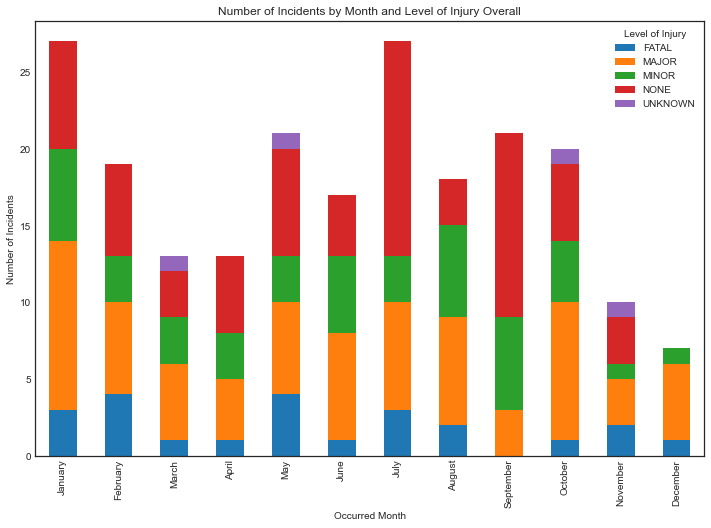

In [42]:
# Plotting
pivot_month_df.plot(kind='bar', stacked=True, figsize = (12,8))
plt.title('Number of Incidents by Month and Level of Injury Overall')
plt.xlabel('Occurred Month')
plt.ylabel('Number of Incidents')
plt.legend(title='Level of Injury')
#plt.xticks(list(pivot_month_df['Occurred_Month']))
plt.show()

In [42]:
figure = px.bar(pivot_month_df, x =pivot_month_df.index, y = pivot_month_df.columns, labels={"variable": "Level of Injury",
                                                "Occurred_Month" : 'Occurred Month',
                                                "value" : "Number of Incidents"},
                                        title= "Number of Incidents by Month and Level of Injury Overall"
               )
figure.update_layout(title={
                         'text': 'Number of Incidents by Month and Level of Injury Overall',
                         'x': 0.5,  # Center the title horizontally
                         'xanchor': 'center'  # Anchor the title to the center
})
figure

In [43]:
df_month_peryear = df_peryear[['Occurred_Month', 'Level_of_Injury', 'ID']].groupby(['Occurred_Month','Level_of_Injury']).count() 
df_month_peryear = df_month_peryear.reset_index()
#df_month_peryear

In [44]:
df_month_peryear_sorted = Sort_Dataframeby_Month(df=df_month_peryear,monthcolumnname='Occurred_Month')
#df_month_peryear_sorted

In [45]:
pivot_month_peryear_df = df_month_peryear_sorted.pivot(index='Occurred_Month', columns='Level_of_Injury', values='ID')
pivot_month_peryear_df = pivot_month_peryear_df.reset_index()
pivot_month_peryear_df = Sort_Dataframeby_Month(df=pivot_month_peryear_df,monthcolumnname='Occurred_Month')
pivot_month_peryear_df = pivot_month_peryear_df.set_index('Occurred_Month')
pivot_month_peryear_df

,FATAL,MAJOR,MINOR,NONE
Occurred_Month,,,,
January,2.0,3.0,1.0,2.0
February,1.0,1.0,NaN,1.0
March,NaN,4.0,1.0,1.0
April,NaN,1.0,NaN,1.0
May,1.0,1.0,1.0,5.0
June,NaN,NaN,3.0,NaN
July,NaN,1.0,NaN,1.0
August,NaN,NaN,NaN,1.0
September,NaN,NaN,2.0,1.0


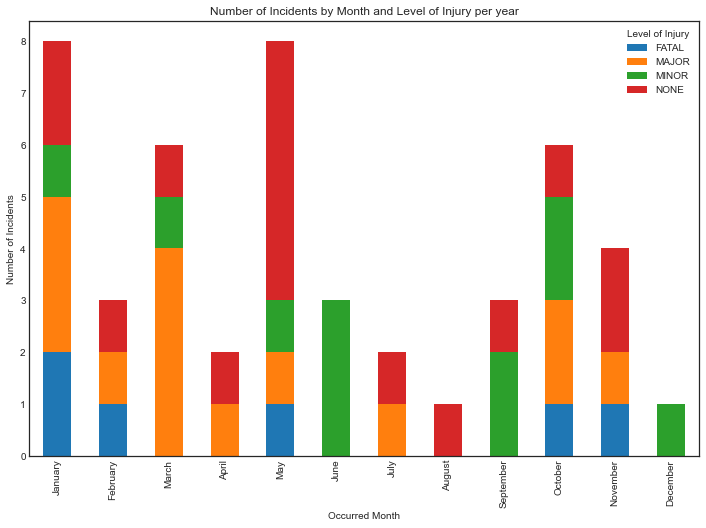

In [46]:
# Plotting
pivot_month_peryear_df.plot(kind='bar', stacked=True, figsize = (12,8))
plt.title('Number of Incidents by Month and Level of Injury per year')
plt.xlabel('Occurred Month')
plt.ylabel('Number of Incidents')
plt.legend(title='Level of Injury')
plt.show()

In [47]:
figure = px.bar(pivot_month_peryear_df, x =pivot_month_peryear_df.index, y = pivot_month_peryear_df.columns, labels={"variable": "Level of Injury",
                                                "Occurred_Month" : 'Occurred Month',
                                                "value" : "Number of Incidents"},
                                        title= "Number of Incidents by Month and Level of Injury in 2023"
               )
figure.update_layout(title={
                         'text': 'Number of Incidents by Month and Level of Injury in 2018',
                         'x': 0.5,  # Center the title horizontally
                         'xanchor': 'center'  # Anchor the title to the center
})
figure

In [47]:
overall_top_10_neighborhoods = df['Neighbourhood'].value_counts().head(10)
overall_top_10_neighborhoods

Ledbury - Heron Gate - Ridgemont - Elmwood    15
Byward Market                                 12
Overbrook - McArthur                          10
Hunt Club Park                                 9
Centretown                                     9
Whitehaven - Queensway Terrace North           8
Lowertown                                      8
Greenboro East                                 7
Vanier North                                   6
Britannia Village                              6
Name: Neighbourhood, dtype: int64

In [48]:
overall_top_10_neighborhoods.index

Index(['Ledbury - Heron Gate - Ridgemont - Elmwood', 'Byward Market',
       'Overbrook - McArthur', 'Hunt Club Park', 'Centretown',
       'Whitehaven - Queensway Terrace North', 'Lowertown', 'Greenboro East',
       'Vanier North', 'Britannia Village'],
      dtype='object')

In [49]:
df_Neighbourhood_overall = df[['Neighbourhood', 'Level_of_Injury','ID']]\
                   .groupby(['Neighbourhood','Level_of_Injury']).count()
#df_Neighbourhood =df_Neighbourhood.reset_index()
df_Neighbourhood_overall.head(10)

ID
Neighbourhood                        Level_of_Injury    
Bayshore                             MAJOR             2
                                     MINOR             1
                                     NONE              1
Beacon Hill South - Cardinal Heights MAJOR             1
                                     NONE              1
Bells Corners East                   NONE              1
Bells Corners West                   MAJOR             1
                                     MINOR             1
                                     NONE              2
Billings Bridge - Alta Vista         MAJOR             1

In [50]:
df_Top10Neighbourhoods_overall = df_Neighbourhood_overall.reset_index()
df_Top10Neighbourhoods_overall = df_Top10Neighbourhoods_overall.set_index('Neighbourhood').loc[overall_top_10_neighborhoods.index]
df_Top10Neighbourhoods_overall = df_Top10Neighbourhoods_overall.reset_index()
df_Top10Neighbourhoods_overall.rename(columns = {'index':'Neighbourhood'}, inplace=True)
df_Top10Neighbourhoods_overall

,Neighbourhood,Level_of_Injury,ID
0,Ledbury - Heron Gate - Ridgemont - Elmwood,FATAL,2
1,Ledbury - Heron Gate - Ridgemont - Elmwood,MAJOR,2
2,Ledbury - Heron Gate - Ridgemont - Elmwood,MINOR,7
3,Ledbury - Heron Gate - Ridgemont - Elmwood,NONE,3
4,Ledbury - Heron Gate - Ridgemont - Elmwood,UNKNOWN,1
5,Byward Market,FATAL,2
6,Byward Market,MAJOR,6
7,Byward Market,MINOR,2
8,Byward Market,NONE,2
9,Overbrook - McArthur,MAJOR,3


In [51]:
overall_top_10_neighborhoods.index

Index(['Ledbury - Heron Gate - Ridgemont - Elmwood', 'Byward Market',
       'Overbrook - McArthur', 'Hunt Club Park', 'Centretown',
       'Whitehaven - Queensway Terrace North', 'Lowertown', 'Greenboro East',
       'Vanier North', 'Britannia Village'],
      dtype='object')

In [52]:
pivot_Top10N_overall_df = df_Top10Neighbourhoods_overall.pivot(index='Neighbourhood', columns='Level_of_Injury', values='ID')
pivot_Top10N_overall_df = pivot_Top10N_overall_df.reindex(index = overall_top_10_neighborhoods.index, columns = pivot_Top10N_overall_df.columns)
pivot_Top10N_overall_df

Level_of_Injury,FATAL,MAJOR,MINOR,NONE,UNKNOWN
Ledbury - Heron Gate - Ridgemont - Elmwood,2.0,2.0,7.0,3.0,1.0
Byward Market,2.0,6.0,2.0,2.0,NaN
Overbrook - McArthur,NaN,3.0,2.0,5.0,NaN
Hunt Club Park,1.0,5.0,3.0,NaN,NaN
Centretown,1.0,3.0,3.0,1.0,1.0
Whitehaven - Queensway Terrace North,1.0,1.0,1.0,5.0,NaN
Lowertown,3.0,2.0,NaN,3.0,NaN
Greenboro East,3.0,2.0,1.0,1.0,NaN
Vanier North,NaN,3.0,NaN,3.0,NaN
Britannia Village,NaN,4.0,1.0,1.0,NaN


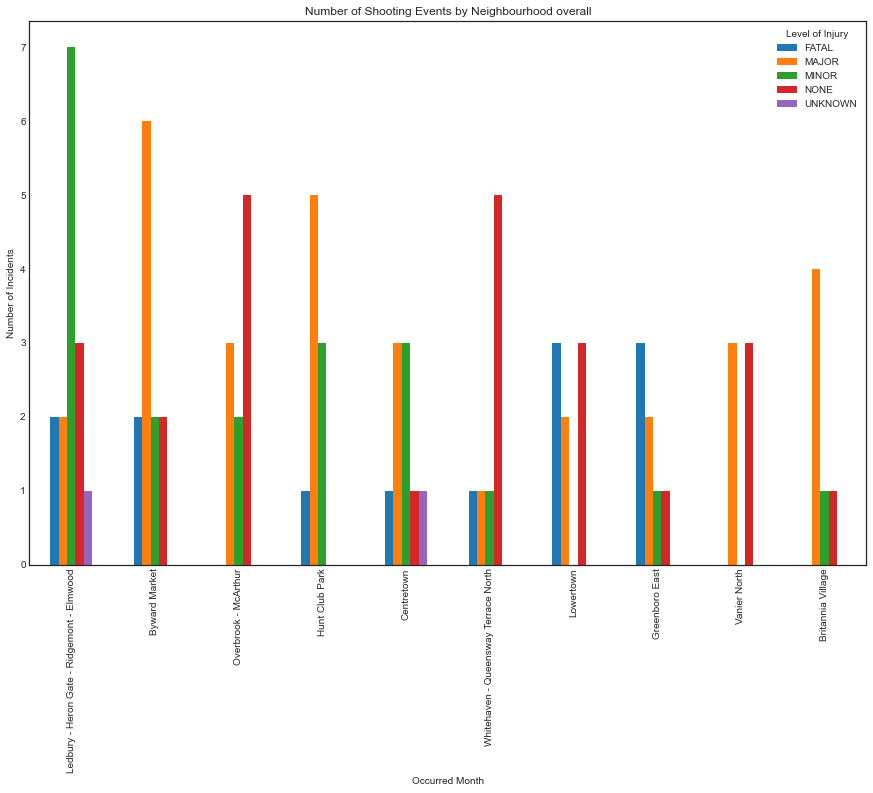

In [53]:
# Plotting
pivot_Top10N_overall_df.plot(kind='bar', stacked=False, figsize = (15,10))
plt.title('Number of Shooting Events by Neighbourhood overall')
plt.xlabel('Occurred Month')
plt.ylabel('Number of Incidents')
plt.legend(title='Level of Injury')
#plt.xticks(list(pivot_month_df['Occurred_Month']))
plt.show()

In [54]:
fig = px.bar(pivot_Top10N_overall_df, x =pivot_Top10N_overall_df.index, y =pivot_Top10N_overall_df.columns,
        labels={"value" : 'Shooting Events', 'index':'Neighbourhood'},
        title= 'Number of Shooting Events by Neighbourhood overall')
fig

In [55]:
top_10_neighborhoods_peryear = df_peryear['Neighbourhood'].value_counts().head(10)

In [56]:
df_Neighbourhood_peryear = df_peryear[['Neighbourhood', 'Level_of_Injury','ID']]\
                   .groupby(['Neighbourhood','Level_of_Injury']).count()    #.nlargest(:,'ID')#.sort_values('Level_of_Injury')
#df_Neighbourhood_peryear =df_Neighbourhood_peryear.reset_index()
df_Neighbourhood_peryear.head(10)

,,ID
Neighbourhood,Level_of_Injury,
Bayshore,MAJOR,1
Bells Corners West,NONE,2
Billings Bridge - Alta Vista,NONE,1
Britannia Village,MAJOR,1
Byward Market,MINOR,1
Carlington,MINOR,1
Carlingwood West - Glabar Park - McKellar Heights,MINOR,1
Carson Grove - Carson Meadows,NONE,1
Centretown,FATAL,1


In [57]:
df_Top10Neighbourhoods_peryear= df_Neighbourhood_peryear.reset_index()
df_Top10Neighbourhoods_peryear = df_Top10Neighbourhoods_peryear.set_index('Neighbourhood').loc[top_10_neighborhoods_peryear.index]
df_Top10Neighbourhoods_peryear = df_Top10Neighbourhoods_peryear.reset_index()
df_Top10Neighbourhoods_peryear.rename(columns = {'index':'Neighbourhood'}, inplace=True)
df_Top10Neighbourhoods_peryear

,Neighbourhood,Level_of_Injury,ID
0,Ledbury - Heron Gate - Ridgemont - Elmwood,MINOR,4
1,Ledbury - Heron Gate - Ridgemont - Elmwood,NONE,2
2,Hunt Club Park,MAJOR,3
3,Hunt Club Park,MINOR,2
4,South Keys - Heron Gate - Greenboro West,FATAL,1
5,South Keys - Heron Gate - Greenboro West,MAJOR,1
6,South Keys - Heron Gate - Greenboro West,MINOR,1
7,South Keys - Heron Gate - Greenboro West,NONE,1
8,Hawthorne Meadows - Sheffield Glen,MAJOR,1
9,Hawthorne Meadows - Sheffield Glen,NONE,2


In [59]:
#df_Top10Neighbourhoods_peryear.index.get_level_values('Neighbourhood')  # getting the index level of a multi index dataframe

In [58]:
top_10_neighborhoods_peryear.index

Index(['Ledbury - Heron Gate - Ridgemont - Elmwood', 'Hunt Club Park',
       'South Keys - Heron Gate - Greenboro West',
       'Hawthorne Meadows - Sheffield Glen', 'Greenboro East',
       'Bells Corners West', 'West Centertown', 'Overbrook - McArthur',
       'Centretown', 'Riverside South - Leitrim'],
      dtype='object')

In [60]:
pivot_Top10N_df_peryear = df_Top10Neighbourhoods_peryear.pivot(index='Neighbourhood', columns='Level_of_Injury', values='ID')
pivot_Top10N_df_peryear = pivot_Top10N_df_peryear.reindex(index = top_10_neighborhoods_peryear.index, columns = pivot_Top10N_df_peryear.columns)
pivot_Top10N_df_peryear

Level_of_Injury,FATAL,MAJOR,MINOR,NONE
Ledbury - Heron Gate - Ridgemont - Elmwood,NaN,NaN,4.0,2.0
Hunt Club Park,NaN,3.0,2.0,NaN
South Keys - Heron Gate - Greenboro West,1.0,1.0,1.0,1.0
Hawthorne Meadows - Sheffield Glen,NaN,1.0,NaN,2.0
Greenboro East,1.0,NaN,NaN,1.0
Bells Corners West,NaN,NaN,NaN,2.0
West Centertown,NaN,2.0,NaN,NaN
Overbrook - McArthur,NaN,1.0,NaN,1.0
Centretown,1.0,NaN,1.0,NaN
Riverside South - Leitrim,NaN,1.0,NaN,NaN


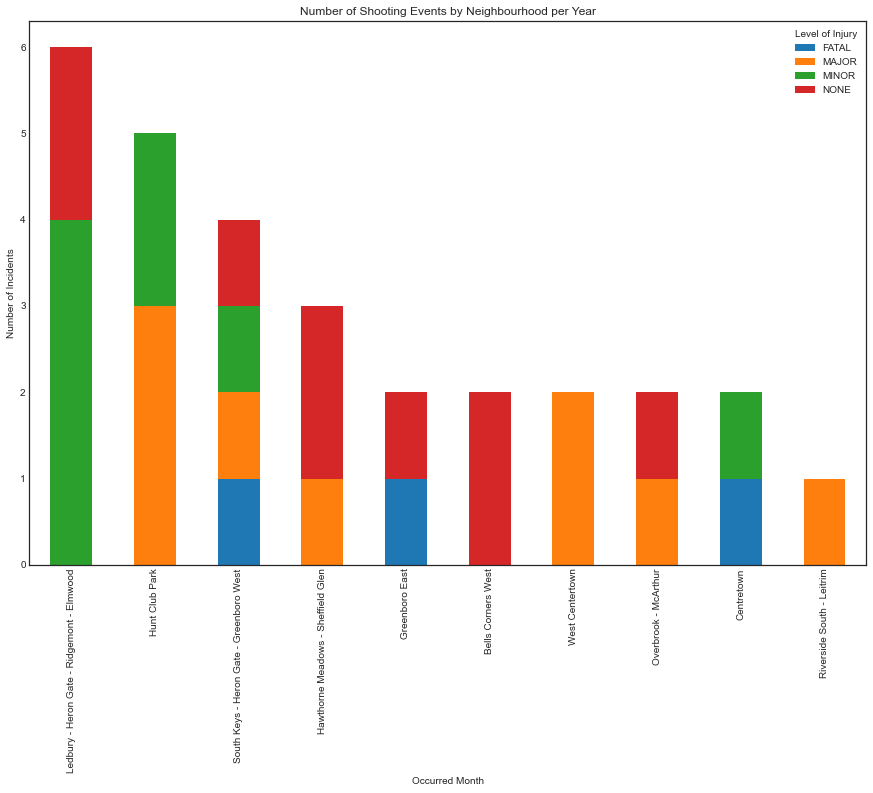

In [61]:
# Plotting
pivot_Top10N_df_peryear.plot(kind='bar', stacked=True, figsize = (15,10))
plt.title('Number of Shooting Events by Neighbourhood per Year')
plt.xlabel('Occurred Month')
plt.ylabel('Number of Incidents')
plt.legend(title='Level of Injury')
plt.show()

In [62]:
fig = px.bar(pivot_Top10N_df_peryear, x =pivot_Top10N_df_peryear.index, y =pivot_Top10N_df_peryear.columns,
        labels={"value" : 'Shooting Events', 'index':'Neighbourhood'},
        title= 'Number of Shooting Events by Neighbourhood per Year')
fig

In [63]:
top_10_wards_overall = df[['Ward','Councillor']].value_counts().head(10)
top_10_wards_overall

Ward                            Councillor       
Ward 10 - Gloucester-Southgate  Jessica Bradley      37
Ward 12 - Rideau-Vanier         Stephanie Plante     31
Ward 7 - Bay                    Theresa Kavanagh     20
Ward 16 - River                 Riley Brockington    19
Ward 8 - College                Laine Johnson        15
Ward 18 - Alta Vista            Marty Carr           15
Ward 14 - Somerset              Ariel Troster        14
Ward 13 - Rideau-Rockcliffe     Rawlson King         11
Ward 11 - Beacon Hill-Cyrville  Tim Tierney           8
Ward 9 - Knoxdale-Merivale      Sean Devine           7
dtype: int64

In [64]:
df_ward_overall = df[['Ward','Councillor','Level_of_Injury','ID']]\
                   .groupby(['Ward','Councillor','Level_of_Injury']).count()    
df_ward_overall =df_ward_overall.reset_index()
df_ward_overall.head(10)
#df_ward_overall[['ID']].groupby(level = 0).sum().sort_values('ID',  ascending = False)

,Ward,Councillor,Level_of_Injury,ID
0,Ward 1 - Orleans East-Cumberland,Matthew Luloff,MINOR,2
1,Ward 10 - Gloucester-Southgate,Jessica Bradley,FATAL,6
2,Ward 10 - Gloucester-Southgate,Jessica Bradley,MAJOR,12
3,Ward 10 - Gloucester-Southgate,Jessica Bradley,MINOR,11
4,Ward 10 - Gloucester-Southgate,Jessica Bradley,NONE,7
5,Ward 10 - Gloucester-Southgate,Jessica Bradley,UNKNOWN,1
6,Ward 11 - Beacon Hill-Cyrville,Tim Tierney,FATAL,2
7,Ward 11 - Beacon Hill-Cyrville,Tim Tierney,MAJOR,4
8,Ward 11 - Beacon Hill-Cyrville,Tim Tierney,NONE,2
9,Ward 12 - Rideau-Vanier,Stephanie Plante,FATAL,5


In [65]:
top_10_wards_overall.index.get_level_values('Ward')

Index(['Ward 10 - Gloucester-Southgate', 'Ward 12 - Rideau-Vanier',
       'Ward 7 - Bay', 'Ward 16 - River', 'Ward 8 - College',
       'Ward 18 - Alta Vista', 'Ward 14 - Somerset',
       'Ward 13 - Rideau-Rockcliffe', 'Ward 11 - Beacon Hill-Cyrville',
       'Ward 9 - Knoxdale-Merivale'],
      dtype='object', name='Ward')

In [66]:
df_Top10Wards_overall = df_ward_overall.set_index('Ward').loc[top_10_wards_overall.index.get_level_values('Ward')]
df_Top10Wards_overall = df_Top10Wards_overall.reset_index()
df_Top10Wards_overall


,Ward,Councillor,Level_of_Injury,ID
0,Ward 10 - Gloucester-Southgate,Jessica Bradley,FATAL,6
1,Ward 10 - Gloucester-Southgate,Jessica Bradley,MAJOR,12
2,Ward 10 - Gloucester-Southgate,Jessica Bradley,MINOR,11
3,Ward 10 - Gloucester-Southgate,Jessica Bradley,NONE,7
4,Ward 10 - Gloucester-Southgate,Jessica Bradley,UNKNOWN,1
5,Ward 12 - Rideau-Vanier,Stephanie Plante,FATAL,5
6,Ward 12 - Rideau-Vanier,Stephanie Plante,MAJOR,14
7,Ward 12 - Rideau-Vanier,Stephanie Plante,MINOR,2
8,Ward 12 - Rideau-Vanier,Stephanie Plante,NONE,10
9,Ward 7 - Bay,Theresa Kavanagh,FATAL,1


In [67]:
pivot_Top10Wards_overall_df = df_Top10Wards_overall.pivot(index=['Ward','Councillor'], columns='Level_of_Injury', values='ID')
pivot_Top10Wards_overall_df

,Level_of_Injury,FATAL,MAJOR,MINOR,NONE,UNKNOWN
Ward,Councillor,,,,,
Ward 10 - Gloucester-Southgate,Jessica Bradley,6.0,12.0,11.0,7.0,1.0
Ward 11 - Beacon Hill-Cyrville,Tim Tierney,2.0,4.0,NaN,2.0,NaN
Ward 12 - Rideau-Vanier,Stephanie Plante,5.0,14.0,2.0,10.0,NaN
Ward 13 - Rideau-Rockcliffe,Rawlson King,1.0,3.0,2.0,5.0,NaN
Ward 14 - Somerset,Ariel Troster,1.0,7.0,3.0,2.0,1.0
Ward 16 - River,Riley Brockington,2.0,5.0,5.0,6.0,1.0
Ward 18 - Alta Vista,Marty Carr,1.0,3.0,5.0,6.0,NaN
Ward 7 - Bay,Theresa Kavanagh,1.0,7.0,5.0,7.0,NaN
Ward 8 - College,Laine Johnson,1.0,2.0,2.0,9.0,1.0


In [68]:
pivot_Top10Wards_overall_df = pivot_Top10Wards_overall_df.reindex(index = top_10_wards_overall.index, columns = pivot_Top10Wards_overall_df.columns)
pivot_Top10Wards_overall_df

,Level_of_Injury,FATAL,MAJOR,MINOR,NONE,UNKNOWN
Ward,Councillor,,,,,
Ward 10 - Gloucester-Southgate,Jessica Bradley,6.0,12.0,11.0,7.0,1.0
Ward 12 - Rideau-Vanier,Stephanie Plante,5.0,14.0,2.0,10.0,NaN
Ward 7 - Bay,Theresa Kavanagh,1.0,7.0,5.0,7.0,NaN
Ward 16 - River,Riley Brockington,2.0,5.0,5.0,6.0,1.0
Ward 8 - College,Laine Johnson,1.0,2.0,2.0,9.0,1.0
Ward 18 - Alta Vista,Marty Carr,1.0,3.0,5.0,6.0,NaN
Ward 14 - Somerset,Ariel Troster,1.0,7.0,3.0,2.0,1.0
Ward 13 - Rideau-Rockcliffe,Rawlson King,1.0,3.0,2.0,5.0,NaN
Ward 11 - Beacon Hill-Cyrville,Tim Tierney,2.0,4.0,NaN,2.0,NaN


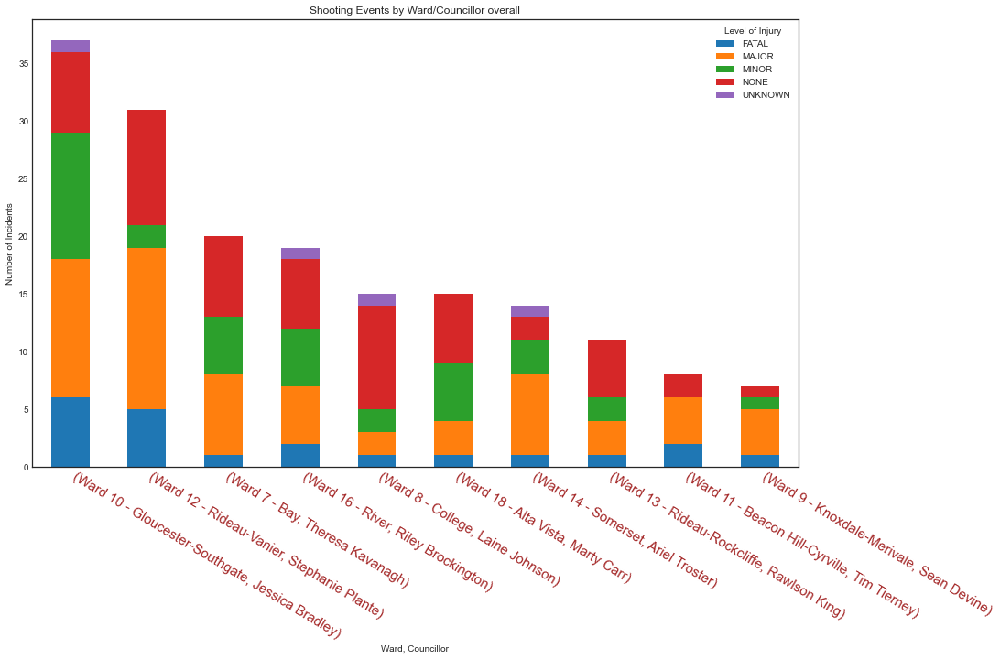

In [69]:
pivot_Top10Wards_overall_df.plot(kind='bar', stacked=True, figsize =(15,9))
plt.title('Shooting Events by Ward/Councillor overall')
plt.xlabel('Ward, Councillor')
plt.ylabel('Number of Incidents')
plt.legend(title='Level of Injury')
plt.xticks(rotation = -31, ha='left',color = 'brown', fontsize=15)

plt.show()

In [70]:
pivot_Top10Wards_overall_dfb = pivot_Top10Wards_overall_df.reset_index()
pivot_Top10Wards_overall_dfb['MultiIndexLabel'] =pivot_Top10Wards_overall_dfb['Ward'].astype(str) + ' - ' + pivot_Top10Wards_overall_dfb['Councillor']
pivot_Top10Wards_overall_dfb
#plotly does not support multi index labels at this time. 

Level_of_Injury,Ward,Councillor,FATAL,MAJOR,MINOR,NONE,UNKNOWN,MultiIndexLabel
0,Ward 10 - Gloucester-Southgate,Jessica Bradley,6.0,12.0,11.0,7.0,1.0,Ward 10 - Gloucester-Southgate - Jessica Bradley
1,Ward 12 - Rideau-Vanier,Stephanie Plante,5.0,14.0,2.0,10.0,NaN,Ward 12 - Rideau-Vanier - Stephanie Plante
2,Ward 7 - Bay,Theresa Kavanagh,1.0,7.0,5.0,7.0,NaN,Ward 7 - Bay - Theresa Kavanagh
3,Ward 16 - River,Riley Brockington,2.0,5.0,5.0,6.0,1.0,Ward 16 - River - Riley Brockington
4,Ward 8 - College,Laine Johnson,1.0,2.0,2.0,9.0,1.0,Ward 8 - College - Laine Johnson
5,Ward 18 - Alta Vista,Marty Carr,1.0,3.0,5.0,6.0,NaN,Ward 18 - Alta Vista - Marty Carr
6,Ward 14 - Somerset,Ariel Troster,1.0,7.0,3.0,2.0,1.0,Ward 14 - Somerset - Ariel Troster
7,Ward 13 - Rideau-Rockcliffe,Rawlson King,1.0,3.0,2.0,5.0,NaN,Ward 13 - Rideau-Rockcliffe - Rawlson King
8,Ward 11 - Beacon Hill-Cyrville,Tim Tierney,2.0,4.0,NaN,2.0,NaN,Ward 11 - Beacon Hill-Cyrville - Tim Tierney
9,Ward 9 - Knoxdale-Merivale,Sean Devine,1.0,4.0,1.0,1.0,NaN,Ward 9 - Knoxdale-Merivale - Sean Devine


In [71]:
pivot_Top10Wards_overall_dfa = pivot_Top10Wards_overall_df.reset_index().set_index('Ward')
pivot_Top10Wards_overall_dfa = pivot_Top10Wards_overall_dfa.drop(columns='Councillor')
pivot_Top10Wards_overall_dfa

Level_of_Injury,FATAL,MAJOR,MINOR,NONE,UNKNOWN
Ward,,,,,
Ward 10 - Gloucester-Southgate,6.0,12.0,11.0,7.0,1.0
Ward 12 - Rideau-Vanier,5.0,14.0,2.0,10.0,NaN
Ward 7 - Bay,1.0,7.0,5.0,7.0,NaN
Ward 16 - River,2.0,5.0,5.0,6.0,1.0
Ward 8 - College,1.0,2.0,2.0,9.0,1.0
Ward 18 - Alta Vista,1.0,3.0,5.0,6.0,NaN
Ward 14 - Somerset,1.0,7.0,3.0,2.0,1.0
Ward 13 - Rideau-Rockcliffe,1.0,3.0,2.0,5.0,NaN
Ward 11 - Beacon Hill-Cyrville,2.0,4.0,NaN,2.0,NaN


In [72]:
pivot_Top10Wards_overall_dfa.columns

Index(['FATAL', 'MAJOR', 'MINOR', 'NONE', 'UNKNOWN'], dtype='object', name='Level_of_Injury')

In [73]:
px.bar(pivot_Top10Wards_overall_dfb, x ='MultiIndexLabel', y =pivot_Top10Wards_overall_dfa.columns,
        labels={"value" : 'Shooting Events', 'MultiIndexLabel':'MultiIndexLabel - Ward, Councillor', 'variable': 'Level of Injury'},
        title= 'Shooting Events by Ward/Councillor overall')

In [74]:
top_10_wards_peryear = df_peryear[['Ward','Councillor']].value_counts().head(10)
top_10_wards_peryear

Ward                            Councillor       
Ward 10 - Gloucester-Southgate  Jessica Bradley      14
Ward 16 - River                 Riley Brockington     5
Ward 12 - Rideau-Vanier         Stephanie Plante      4
Ward 14 - Somerset              Ariel Troster         4
Ward 18 - Alta Vista            Marty Carr            4
Ward 7 - Bay                    Theresa Kavanagh      4
Ward 13 - Rideau-Rockcliffe     Rawlson King          2
Ward 8 - College                Laine Johnson         2
Ward 9 - Knoxdale-Merivale      Sean Devine           2
Ward 15 - Kitchissippi          Jeff Leiper           1
dtype: int64

In [75]:
df_ward_peryear = df_peryear[['Ward','Councillor','Level_of_Injury','ID']]\
                   .groupby(['Ward','Councillor','Level_of_Injury']).count()    
df_ward_peryear =df_ward_peryear.reset_index()
df_ward_peryear.head(10)

,Ward,Councillor,Level_of_Injury,ID
0,Ward 10 - Gloucester-Southgate,Jessica Bradley,FATAL,2
1,Ward 10 - Gloucester-Southgate,Jessica Bradley,MAJOR,4
2,Ward 10 - Gloucester-Southgate,Jessica Bradley,MINOR,5
3,Ward 10 - Gloucester-Southgate,Jessica Bradley,NONE,3
4,Ward 12 - Rideau-Vanier,Stephanie Plante,MAJOR,1
5,Ward 12 - Rideau-Vanier,Stephanie Plante,MINOR,1
6,Ward 12 - Rideau-Vanier,Stephanie Plante,NONE,2
7,Ward 13 - Rideau-Rockcliffe,Rawlson King,MAJOR,1
8,Ward 13 - Rideau-Rockcliffe,Rawlson King,NONE,1
9,Ward 14 - Somerset,Ariel Troster,FATAL,1


In [76]:
df_Top10Wards_peryear = df_ward_peryear.set_index('Ward').loc[top_10_wards_peryear.index.get_level_values('Ward')]
df_Top10Wards_peryear = df_Top10Wards_peryear.reset_index()
df_Top10Wards_peryear

,Ward,Councillor,Level_of_Injury,ID
0,Ward 10 - Gloucester-Southgate,Jessica Bradley,FATAL,2
1,Ward 10 - Gloucester-Southgate,Jessica Bradley,MAJOR,4
2,Ward 10 - Gloucester-Southgate,Jessica Bradley,MINOR,5
3,Ward 10 - Gloucester-Southgate,Jessica Bradley,NONE,3
4,Ward 16 - River,Riley Brockington,FATAL,1
5,Ward 16 - River,Riley Brockington,MINOR,3
6,Ward 16 - River,Riley Brockington,NONE,1
7,Ward 12 - Rideau-Vanier,Stephanie Plante,MAJOR,1
8,Ward 12 - Rideau-Vanier,Stephanie Plante,MINOR,1
9,Ward 12 - Rideau-Vanier,Stephanie Plante,NONE,2


In [77]:
pivot_Top10Wards_peryear_df = df_Top10Wards_peryear.pivot(index=['Ward','Councillor'], columns='Level_of_Injury', values='ID')
pivot_Top10Wards_peryear_df

,Level_of_Injury,FATAL,MAJOR,MINOR,NONE
Ward,Councillor,,,,
Ward 10 - Gloucester-Southgate,Jessica Bradley,2.0,4.0,5.0,3.0
Ward 12 - Rideau-Vanier,Stephanie Plante,NaN,1.0,1.0,2.0
Ward 13 - Rideau-Rockcliffe,Rawlson King,NaN,1.0,NaN,1.0
Ward 14 - Somerset,Ariel Troster,1.0,2.0,1.0,NaN
Ward 15 - Kitchissippi,Jeff Leiper,1.0,NaN,NaN,NaN
Ward 16 - River,Riley Brockington,1.0,NaN,3.0,1.0
Ward 18 - Alta Vista,Marty Carr,NaN,1.0,NaN,3.0
Ward 7 - Bay,Theresa Kavanagh,NaN,3.0,1.0,NaN
Ward 8 - College,Laine Johnson,NaN,NaN,NaN,2.0


In [78]:
pivot_Top10Wards_peryear_df = pivot_Top10Wards_peryear_df.reindex(index = top_10_wards_peryear.index, columns = pivot_Top10Wards_peryear_df.columns)
pivot_Top10Wards_peryear_df

,Level_of_Injury,FATAL,MAJOR,MINOR,NONE
Ward,Councillor,,,,
Ward 10 - Gloucester-Southgate,Jessica Bradley,2.0,4.0,5.0,3.0
Ward 16 - River,Riley Brockington,1.0,NaN,3.0,1.0
Ward 12 - Rideau-Vanier,Stephanie Plante,NaN,1.0,1.0,2.0
Ward 14 - Somerset,Ariel Troster,1.0,2.0,1.0,NaN
Ward 18 - Alta Vista,Marty Carr,NaN,1.0,NaN,3.0
Ward 7 - Bay,Theresa Kavanagh,NaN,3.0,1.0,NaN
Ward 13 - Rideau-Rockcliffe,Rawlson King,NaN,1.0,NaN,1.0
Ward 8 - College,Laine Johnson,NaN,NaN,NaN,2.0
Ward 9 - Knoxdale-Merivale,Sean Devine,1.0,NaN,NaN,1.0


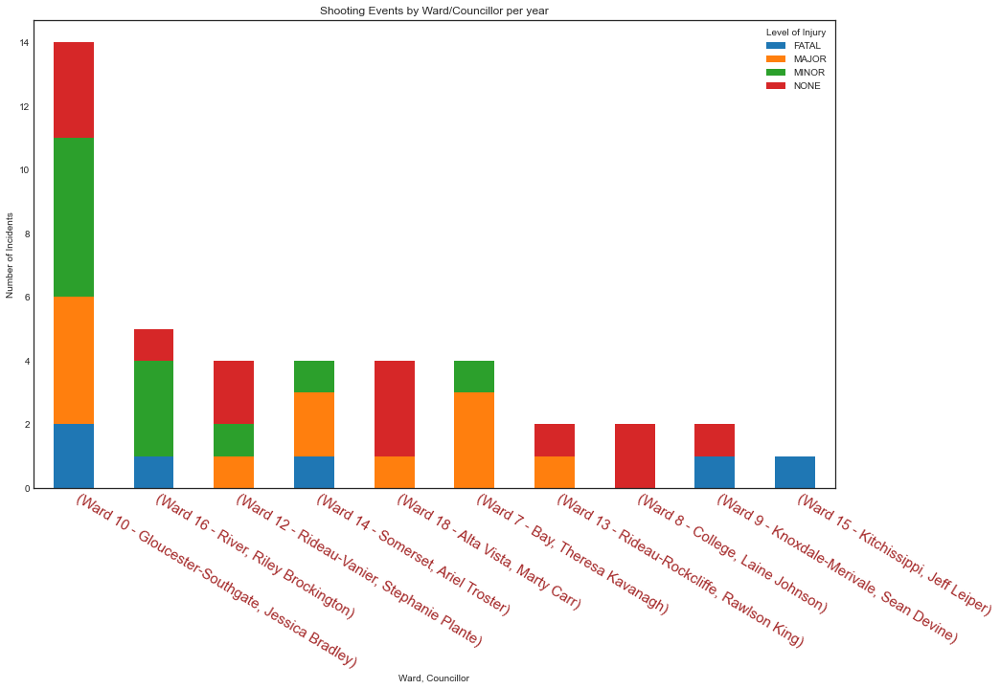

In [79]:
pivot_Top10Wards_peryear_df.plot(kind='bar', stacked=True, figsize =(15,9))
plt.title('Shooting Events by Ward/Councillor per year')
plt.xlabel('Ward, Councillor')
plt.ylabel('Number of Incidents')
plt.legend(title='Level of Injury')
plt.xticks(rotation = -31, ha='left',color = 'brown', fontsize=15)

plt.show()

In [80]:
pivot_Top10Wards_peryear_dfb = pivot_Top10Wards_peryear_df.reset_index()
pivot_Top10Wards_peryear_dfb['MultiIndexLabel'] = pivot_Top10Wards_peryear_dfb['Ward'].astype(str) + ' - ' + pivot_Top10Wards_peryear_dfb['Councillor']
pivot_Top10Wards_peryear_dfb
#plotly does not support multi index labels at this time. 

Level_of_Injury,Ward,Councillor,FATAL,MAJOR,MINOR,NONE,MultiIndexLabel
0,Ward 10 - Gloucester-Southgate,Jessica Bradley,2.0,4.0,5.0,3.0,Ward 10 - Gloucester-Southgate - Jessica Bradley
1,Ward 16 - River,Riley Brockington,1.0,NaN,3.0,1.0,Ward 16 - River - Riley Brockington
2,Ward 12 - Rideau-Vanier,Stephanie Plante,NaN,1.0,1.0,2.0,Ward 12 - Rideau-Vanier - Stephanie Plante
3,Ward 14 - Somerset,Ariel Troster,1.0,2.0,1.0,NaN,Ward 14 - Somerset - Ariel Troster
4,Ward 18 - Alta Vista,Marty Carr,NaN,1.0,NaN,3.0,Ward 18 - Alta Vista - Marty Carr
5,Ward 7 - Bay,Theresa Kavanagh,NaN,3.0,1.0,NaN,Ward 7 - Bay - Theresa Kavanagh
6,Ward 13 - Rideau-Rockcliffe,Rawlson King,NaN,1.0,NaN,1.0,Ward 13 - Rideau-Rockcliffe - Rawlson King
7,Ward 8 - College,Laine Johnson,NaN,NaN,NaN,2.0,Ward 8 - College - Laine Johnson
8,Ward 9 - Knoxdale-Merivale,Sean Devine,1.0,NaN,NaN,1.0,Ward 9 - Knoxdale-Merivale - Sean Devine
9,Ward 15 - Kitchissippi,Jeff Leiper,1.0,NaN,NaN,NaN,Ward 15 - Kitchissippi - Jeff Leiper


In [81]:
pivot_Top10Wards_peryear_dfa = pivot_Top10Wards_peryear_df.reset_index().set_index('Ward')
pivot_Top10Wards_peryear_dfa = pivot_Top10Wards_peryear_dfa.drop(columns='Councillor')
pivot_Top10Wards_peryear_dfa

Level_of_Injury,FATAL,MAJOR,MINOR,NONE
Ward,,,,
Ward 10 - Gloucester-Southgate,2.0,4.0,5.0,3.0
Ward 16 - River,1.0,NaN,3.0,1.0
Ward 12 - Rideau-Vanier,NaN,1.0,1.0,2.0
Ward 14 - Somerset,1.0,2.0,1.0,NaN
Ward 18 - Alta Vista,NaN,1.0,NaN,3.0
Ward 7 - Bay,NaN,3.0,1.0,NaN
Ward 13 - Rideau-Rockcliffe,NaN,1.0,NaN,1.0
Ward 8 - College,NaN,NaN,NaN,2.0
Ward 9 - Knoxdale-Merivale,1.0,NaN,NaN,1.0


In [82]:
px.bar(pivot_Top10Wards_peryear_dfb, x ='MultiIndexLabel', y =pivot_Top10Wards_peryear_dfa.columns,
        labels={"value" : 'Shooting Events', 'MultiIndexLabel':'MultiIndexLabel - Ward, Councillor', 'variable': 'Level of Injury'},
        title= 'Shooting Events by Ward/Councillor peryear')

In [9]:
ward_layer  = 'https://open.ottawa.ca/datasets/ottawa::wards-2022-2026.geojson'
response = requests.get(ward_layer)

ward_layer = response.json()

In [24]:
division_layer = 'https://services7.arcgis.com/2vhcNzw0NfUwAD3d/arcgis/rest/services/OPS_Divisions_Open_Data/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson'
response1 = requests.get(division_layer)
division_layer = response1.json()

In [37]:
fig1 = px.scatter_mapbox(df_peryear,
                        lat=df_peryear.y,
                        lon=df_peryear.x,
                        hover_name='Neighbourhood',
                        #hover_data = {'x':False, 'y':False,},# 'Neighbourhood':True,'Councillor':True},
                        mapbox_style ='open-street-map',
                        labels={"x": "Longitude",\
                                "y":  'Latitude'},
                        center = {"lat": 45.2515, "lon": -75.6972},
                        zoom=8)

fig1.update_traces(
    marker = {'size':7},
    hovertemplate= "<b>%{hovertext}</b><br><br>" +  # Country Name
                  "<b>%{customdata[0]}</b><br>" + 
                  "Councillor: %{customdata[1]}<br>"  +
                  "Level of Injury: %{customdata[2]}<br>",   
                  #"<extra></extra>",  # Remove the "trace name" that appears below the hover box
    customdata=df_peryear[['Ward','Councillor', 'Level_of_Injury' ]].values,
    hovertext=df_peryear['Neighbourhood']
)

fig1.update_layout(mapbox_layers=[
    {
        'sourcetype': 'geojson',
        'source': ward_layer,  # GeoJSON data loaded from the URL
        'type': 'line',        # Use 'line' to show ward boundaries
        'color': 'black',       # Color of the lines
        'line': {'width': 0.8}   # Width of the boundary lines
    }
])

fig1.show()

In [35]:
fig1 = px.scatter_mapbox(df,
                        lat=df.y,
                        lon=df.x,
                        hover_name='Neighbourhood',
                        #hover_data = {'x':False, 'y':False,},# 'Neighbourhood':True,'Councillor':True},
                        mapbox_style ='open-street-map',
                        labels={"x": "Longitude",\
                                "y":  'Latitude'},
                        center = {"lat": 45.2515, "lon": -75.6972},
                        zoom=8)

fig1.update_traces(
    marker = {'size':7},
    hovertemplate= "<b>%{hovertext}</b><br><br>" +  # Country Name
                  "<b>%{customdata[0]}</b><br>" + 
                  "Councillor: %{customdata[1]}<br>"  +
                  "Level of Injury: %{customdata[2]}<br>",   
                  #"<extra></extra>",  # Remove the "trace name" that appears below the hover box
    customdata=df[['Ward','Councillor', 'Level_of_Injury' ]].values,
    hovertext=df['Neighbourhood']
)

fig1.update_layout(mapbox_layers=[
    {
        'sourcetype': 'geojson',
        'source': ward_layer,  # GeoJSON data loaded from the URL
        'type': 'line',        # Use 'line' to show ward boundaries
        'color': 'black',       # Color of the lines
        'line': {'width': 0.8}   # Width of the boundary lines
    }
])

fig1.show()

In [28]:
#filter Level of Injury 
df_LoI= df[df['Level_of_Injury'] == 'FATAL']


In [34]:
fig1 = px.scatter_mapbox(df_LoI,
                        lat=df_LoI.y,
                        lon=df_LoI.x,
                        hover_name='Neighbourhood',
                        #hover_data = {'x':False, 'y':False,},# 'Neighbourhood':True,'Councillor':True},
                        mapbox_style ='open-street-map',
                        labels={"x": "Longitude",\
                                "y":  'Latitude'},
                        center = {"lat": 45.2515, "lon": -75.6972},
                        zoom=8)

fig1.update_traces(
    marker = {'size':7},
    hovertemplate= "<b>%{hovertext}</b><br><br>" +  # Country Name
                  "<b>%{customdata[0]}</b><br>" + 
                  "Councillor: %{customdata[1]}<br>"  +
                  "Level of Injury: %{customdata[2]}<br>",   
                  #"<extra></extra>",  # Remove the "trace name" that appears below the hover box
    customdata=df_LoI[['Ward','Councillor', 'Level_of_Injury' ]].values,
    hovertext=df_LoI['Neighbourhood']
)

fig1.update_layout(mapbox_layers=[
    {
        'sourcetype': 'geojson',
        'source': ward_layer,  # GeoJSON data loaded from the URL
        'type': 'line',        # Use 'line' to show ward boundaries
        'color': 'black',       # Color of the lines
        'line': {'width': 0.8}   # Width of the boundary lines
    }
])

fig1.show()

In [33]:
fig1 = px.scatter_mapbox(df,
                        lat=df.y,
                        lon=df.x,
                        width=750,  # Set the width of the map (pixels)
                        height=650,
                        hover_name='Neighbourhood',
                        #hover_data = {'x':False, 'y':False,},# 'Neighbourhood':True,'Councillor':True},
                        mapbox_style ='open-street-map',
                        labels={"x": "Longitude",\
                                "y":  'Latitude'},
                        center = {"lat": 45.2515, "lon": -75.6972},
                        zoom=8.5)
fig1.update_traces(
    marker = {'size':7},
    hovertemplate= "<b>%{hovertext}</b><br><br>" +  # Country Name
                  "<b>%{customdata[0]}</b><br>" + 
                  "Councillor: %{customdata[1]}<br>"  +
                  "Level of Injury: %{customdata[2]}<br>",   
                  #"<extra></extra>",  # Remove the "trace name" that appears below the hover box
    customdata=df[['Ward','Councillor', 'Level_of_Injury' ]].values,
    hovertext=df['Neighbourhood']
)
fig1.update_layout(mapbox_layers=[
    {
        'sourcetype': 'geojson',
        'source': division_layer,  # GeoJSON data loaded from the URL
        'type': 'line',        # Use 'line' to show ward boundaries
        'color': 'black',       # Color of the lines
        'line': {'width': 1}   # Width of the boundary lines
    }
])

fig1.add_annotation(
    x=0.3,  # Longitude   45.288370, -76.389214
    y=0.4,  # Latitude
    text="West Ottawa",  # Label
    showarrow=True,
    arrowhead=2,
    xref='paper', yref='paper',
    font=dict(size=10, color="white"),
    bgcolor="rgba(0,0,0,0.7)"
)
fig1.add_annotation(
    x=0.7,  # Longitude   45.288370, -76.389214
    y=0.65,  # Latitude
    text="East Ottawa",  # Label
    showarrow=True,
    arrowhead=2,
    xref='paper', yref='paper',
    font=dict(size=10, color="white"),
    bgcolor="rgba(0,0,0,0.7)"
)

fig1.add_annotation(
    x=0.5,  # Longitude   45.288370, -76.389214
    y=0.77,  # Latitude
    text="Central Ottawa",  # Label
    showarrow=True,
    arrowhead=2,
    xref='paper', yref='paper',
    font=dict(size=10, color="white"),
    bgcolor="rgba(0,0,0,0.7)"
)
fig1.show()

In [7]:
df_stuff = df[df['Neighbourhood'] == 'Britannia Village']
df_stuff

,ID,Occurred_Date,Occurred_Month,Occurred_Year,Time_of_Day,Weekday,Neighbourhood,Division,Ward,Councillor,Level_of_Injury,x,y
151,3661,2019-08-08,August,2019,Night,Thursday,Britannia Village,West,Ward 7 - Bay,Theresa Kavanagh,MINOR,-75.801114,45.357757
156,3661,2022-07-06,July,2022,Afternoon,Wednesday,Britannia Village,West,Ward 7 - Bay,Theresa Kavanagh,MAJOR,-75.801114,45.357757
157,3661,2020-07-25,July,2020,Evening,Saturday,Britannia Village,West,Ward 7 - Bay,Theresa Kavanagh,NONE,-75.801114,45.357757
158,3661,2019-06-22,June,2019,Afternoon,Saturday,Britannia Village,West,Ward 7 - Bay,Theresa Kavanagh,MAJOR,-75.801114,45.357757
159,3661,2018-10-29,October,2018,Evening,Monday,Britannia Village,West,Ward 7 - Bay,Theresa Kavanagh,MAJOR,-75.801114,45.357757
160,3661,2019-01-14,January,2019,Evening,Monday,Britannia Village,West,Ward 7 - Bay,Theresa Kavanagh,MAJOR,-75.801114,45.357757


In [12]:
fig1 = px.scatter_mapbox(df_stuff,
                        lat=df_stuff.y,
                        lon=df_stuff.x,
                        hover_name='Neighbourhood',
                        #hover_data = {'x':False, 'y':False,},# 'Neighbourhood':True,'Councillor':True},
                        mapbox_style ='open-street-map',
                        labels={"x": "Longitude",\
                                "y":  'Latitude'},
                        center = {"lat": 45.2515, "lon": -75.6972},
                        zoom=8)

fig1.update_traces(
    marker = {'size':7},
    hovertemplate= "<b>%{hovertext}</b><br><br>" +  # Country Name
                  "<b>%{customdata[0]}</b><br>" + 
                  "Councillor: %{customdata[1]}<br>"  +
                  "Level of Injury: %{customdata[2]}<br>",   
                  #"<extra></extra>",  # Remove the "trace name" that appears below the hover box
    customdata=df_stuff[['Ward','Councillor', 'Level_of_Injury' ]].values,
    hovertext=df_stuff['Neighbourhood']
)

fig1.update_layout(mapbox_layers=[
    {
        'sourcetype': 'geojson',
        'source': ward_layer,  # GeoJSON data loaded from the URL
        'type': 'line',        # Use 'line' to show ward boundaries
        'color': 'black',       # Color of the lines
        'line': {'width': 0.8}   # Width of the boundary lines
    }
])

fig1.show()

In [39]:
%reset